# Importing the dataset and libraries

This part import all the requirement libraries

In [ ]:
!python --version

Python 3.7.13


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Input, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import *
import keras
from PIL import Image
import cv2
import os

# Data Preprocessing

First part defines some constatns and at the second part define function that find all the symbols in CAPTCHA and then load X and Y datasets

In [ ]:
FILE_PATH = '/content/drive/MyDrive/dataset/AIMedic/samples/'
captchaImgShape = (50, 200, 1)
numSamples = len(os.listdir(FILE_PATH))
captchaLength = 5
print(captchaImgShape)
print(numSamples)

(50, 200, 1)
1070


In [ ]:
def find_char(file_path:str=FILE_PATH)->tuple([int,dict]):
  """
    Finding out the characters present in captcha images
    
    Arguments:
        file_path -- Path of datset file
    Returns: 
        num_symbols --  Number of symbols
        characters_dict --  Dictionary of all the characters that used in CAPTCHA
  """
  
  characters_dict = {}
  for i, img in enumerate(os.listdir(file_path)):
    imgName = img.split('.')[0]
    for character in imgName:
      if character not in characters_dict.keys():
        characters_dict[character] = 1
      else:
        characters_dict[character] += 1
  num_symbols = len(characters_dict)
  return num_symbols, characters_dict

In [ ]:
numSymbols, captchaCharacters = find_char(file_path=FILE_PATH)

In [ ]:
X = np.zeros((numSamples, 50, 200, 1))
y = np.zeros((captchaLength, numSamples, numSymbols))
for i, img in enumerate(os.listdir(FILE_PATH)):
  captchaImg = cv2.imread(FILE_PATH+img, cv2.IMREAD_GRAYSCALE)
  captchaImg = captchaImg/255.0
  captchaImg = np.reshape(captchaImg, captchaImgShape)
  X[i] = captchaImg
  currentName = np.zeros((captchaLength, numSymbols))
  captchaName = img.split('.')[0]
  for j, character in enumerate(captchaName):
    currentName[j, list(captchaCharacters.keys()).index(character)] = 1
  y[:, i] = currentName

In [ ]:
print(X.shape)
print(y.shape)

(1070, 50, 200, 1)
(5, 1070, 19)


In [ ]:
type(X)

numpy.ndarray

# Creating Testing and Training Data

This part define a finction that split data to X_train, y_train, X_test and y_test



In [ ]:
def split_data(percentage:int=0.8)->tuple([np.ndarray, np.ndarray, np.ndarray, np.ndarray, int]):

  """
    Split dataset to train set and test set for input and output sets
    
    Arguments:
        percentage -- Percentage of picking data from main dataset
    Returns: 
        X_train --  Input training set
        y_train -- Out put training set
        X_test -- Input testing set
        y_test -- Out put testing set
        num_test -- number of test samples
  """  

  num_training = int(numSamples*percentage)
  num_test = int(numSamples - num_training)
  X_train = X[:num_training]
  y_train = y[:, :num_training]
  X_test = X[num_training:]
  y_test = y[:, num_training:]

  return X_train, y_train, X_test, y_test, num_test


In [ ]:
X_train, y_train, X_test, y_test, numTestingSamples = split_data(percentage=0.8)

In [ ]:
# numTrainingSamples = int(numSamples*0.8)
# numTestingSamples = int(numSamples - numTrainingSamples)
# print(numTrainingSamples)
# print(numTestingSamples)

In [ ]:
# X_train = X[:numTrainingSamples]
# y_train = y[:, :numTrainingSamples]
# X_test = X[numTrainingSamples:]
# y_test = y[:, numTrainingSamples:]

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

print(type(X_test))
print(type(y_test))


(856, 50, 200, 1)
(5, 856, 19)
(214, 50, 200, 1)
(5, 214, 19)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


# Convolutional Neural Network Model

This part define three functions



*   First for all the Convolutional and Max padding layers
*   Second for blocks that predict each characters
*   Third define and compile the main model


At last, fits the model and show the some pictures for model details and plot accuracy and loss of trained model


In [ ]:

def conv_block(inputs:keras.engine.keras_tensor.KerasTensor=None, n_filters:int=32,actvtn:str='relu', krnl_size:int=5, max_pooling:bool=True)-> keras.engine.keras_tensor.KerasTensor:
    """
    Convolutional block
    
    Arguments:
        inputs -- Input numpy ndarray
        n_filters -- Number of filters for the convolutional layer
        actvtn -- activation function of convolutional layer
        krnl_size -- Kernel size of convolutional layer
        max_pooling -- Use MaxPooling2D to reduce the spatial dimensions of the output volume
    Returns: 
        next_layer --  Next layer
    """
    conv = Conv2D(n_filters, # Number of filters
                  krnl_size,   # Kernel size   
                  activation=actvtn,
                  strides=1,
                  padding='same')(inputs)
    
      
    # if max_pooling is True add a MaxPooling2D with 2x2 pool_size
    if max_pooling:
        ### START CODE HERE
        next_layer = MaxPool2D(pool_size=(2, 2), padding='same')(conv)
        ### END CODE HERE
        
    else:
        next_layer = conv
        
    skip_connection = conv
    
    return next_layer

In [ ]:
def char_block(inputs:keras.engine.keras_tensor.KerasTensor=None, n_units:int=64, dropout_prob:float=0.5, block_name:str="character", num_symbols:int=numSymbols)-> keras.engine.keras_tensor.KerasTensor:
    """
    Character block that predicts the digit of CAPTCHA
    
    Arguments:
        inputs -- Input tensor
        n_units -- Number of units for the first Dense layer
        block_name -- The name of each character
        num_symbols -- Number of symbols
    Returns: 
        output --  Next layer and output of this block
    """
    dense = Dense(n_units, activation='relu')(inputs)
    dropout = Dropout(dropout_prob)(dense)
    batchnorm = BatchNormalization()(dropout)
    output = Dense(num_symbols , activation='sigmoid' , name=block_name)(batchnorm)
    
    return output

In [ ]:
def define_model(cap_img_shape:tuple=captchaImgShape)->keras.engine.functional.Functional:

  """
    Define and compile a model for solving CAPTCHA
    
    Arguments:
        cap_img_shape -- Shape of CAPTCHA image
    Returns: 
        model --  The model or solving CAPTCHA
  """

  input = Input(shape=cap_img_shape)

  conv0 = conv_block(inputs=input, n_filters=8, actvtn='relu', krnl_size=5, max_pooling=True)

  conv1 = conv_block(inputs=conv0, n_filters=16, actvtn='relu', krnl_size=3, max_pooling=True)

  conv2 = conv_block(inputs=conv1, n_filters=32, actvtn='relu', krnl_size=3, max_pooling=True)

  conv3 = conv_block(inputs=conv2, n_filters=64, actvtn='leaky_relu', krnl_size=3, max_pooling=True)

  conv4 = conv_block(inputs=conv3, n_filters=128, actvtn='leaky_relu', krnl_size=3, max_pooling=True)


  flat = Flatten()(conv4)
  dropout = Dropout(0.5)(flat)
  batchnorm = BatchNormalization()(dropout)

  output1 = char_block(inputs=batchnorm, n_units=64, dropout_prob=0.5, block_name="character1")

  output2 = char_block(inputs=batchnorm, n_units=64, dropout_prob=0.5, block_name="character2")

  output3 = char_block(inputs=batchnorm, n_units=64, dropout_prob=0.4, block_name="character3")

  output4 = char_block(inputs=batchnorm, n_units=64, dropout_prob=0.4, block_name="character4")

  output5 = char_block(inputs=batchnorm, n_units=64, dropout_prob=0.5, block_name="character5")


  output = [output1, output2, output3, output4, output5]

  model = Model(inputs=input, outputs=output, name="captcha-recognition-cnn-model")

  model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

  return model

In [ ]:
my_model = define_model()

In [ ]:
################
type(my_model)
################

keras.engine.functional.Functional

In [ ]:
my_model.summary()

Model: "captcha-recognition-cnn-model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 50, 200, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d_15 (Conv2D)             (None, 50, 200, 8)   208         ['input_4[0][0]']                
                                                                                                  
 max_pooling2d_15 (MaxPooling2D  (None, 25, 100, 8)  0           ['conv2d_15[0][0]']              
 )                                                                                                
                                                                      

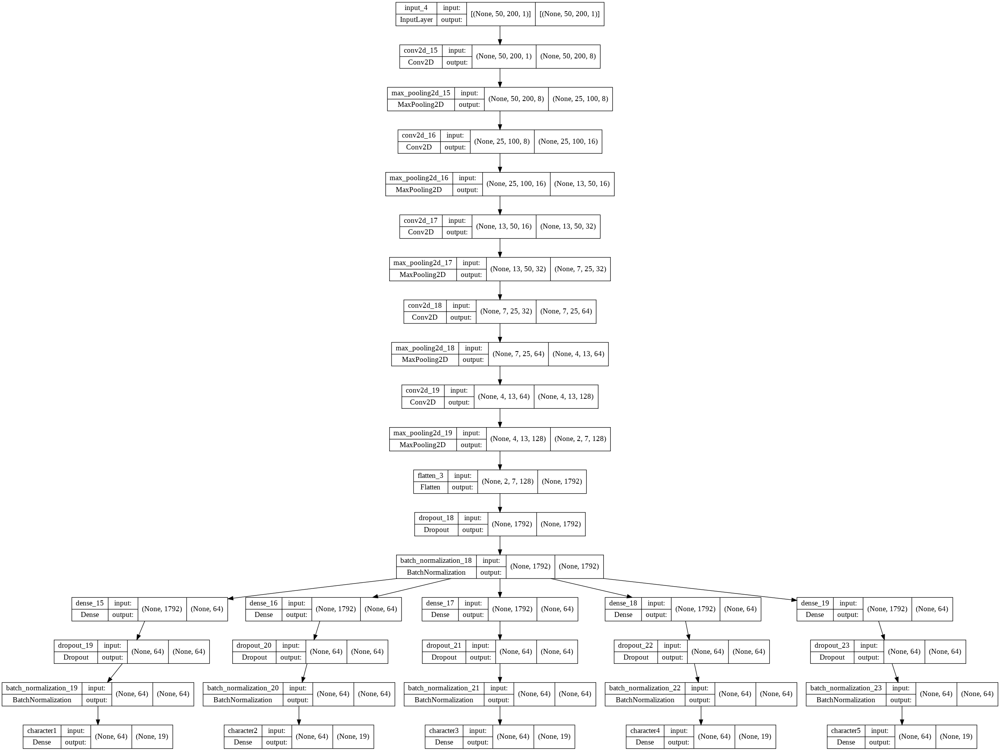

In [ ]:
##########################
tf.keras.utils.plot_model(my_model, show_shapes=True)

In [ ]:
# modelLoss = 'categorical_crossentropy'
# modelMetrics= ['accuracy']
# modelOptimizer= 'adam'
# model.compile(loss=modelLoss, metrics=modelMetrics, optimizer=modelOptimizer)

In [ ]:
history = my_model.fit(X_train, [y_train[0], y_train[1], y_train[2], y_train[3], y_train[4]], epochs = 100, batch_size = 32)                    

Epoch 1/100
27/27 [==============================] - 10s 251ms/step - loss: 17.8976 - character1_loss: 3.5714 - character2_loss: 3.5595 - character3_loss: 3.6233 - character4_loss: 3.5457 - character5_loss: 3.5976 - character1_accuracy: 0.0631 - character2_accuracy: 0.0432 - character3_accuracy: 0.0502 - character4_accuracy: 0.0619 - character5_accuracy: 0.0572
Epoch 2/100
27/27 [==============================] - 7s 249ms/step - loss: 17.5907 - character1_loss: 3.4952 - character2_loss: 3.4972 - character3_loss: 3.5310 - character4_loss: 3.4858 - character5_loss: 3.5814 - character1_accuracy: 0.0491 - character2_accuracy: 0.0467 - character3_accuracy: 0.0596 - character4_accuracy: 0.0631 - character5_accuracy: 0.0502
Epoch 3/100
27/27 [==============================] - 7s 249ms/step - loss: 17.3564 - character1_loss: 3.4297 - character2_loss: 3.4225 - character3_loss: 3.4569 - character4_loss: 3.4992 - character5_loss: 3.5481 - character1_accuracy: 0.0572 - character2_accuracy: 0.0572 

In [ ]:
def display_learning_curves(history:keras.callbacks.History, detail:bool = True)->None:
  """
    Display the learning curve for the model
    
    Arguments:
        history -- History of model
        detail -- If became True, show the main training loss
        
  """

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
  legends = ["train"]
  if not detail:
    ax1.plot(history.history["loss"])
    
  for i in range(1, 6):
    ax1.plot(history.history['character'+ str(i) +'_loss'])
    ax2.plot(history.history['character'+ str(i) +'_accuracy'])
    legends.append("char_" + str(i))

  ax1.legend(legends, loc="upper right")
  ax1.set_xlabel("Epochs")
  ax1.set_ylabel("Loss")

  legends.pop(0)
  ax2.legend(legends, loc="upper right")
  ax2.set_xlabel("Epochs")
  ax2.set_ylabel("Accuracy")
  plt.savefig(fname="learning_curve.png", bbox_inches='tight')
  plt.show()
  


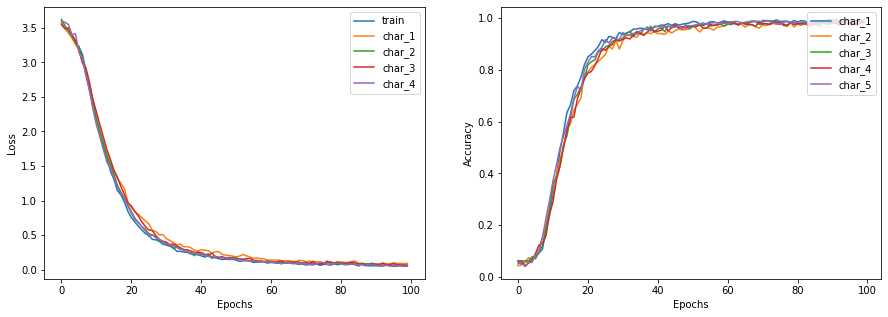

In [ ]:
display_learning_curves(history, detail=True)

# Testing the Model

This part Evaluates the model and test it, enhance, and show some examples

In [ ]:
def eval_model(model: keras.engine.functional.Functional = None, xy:tuple=(X_test, y_test)) -> tuple([list, float, float, float, float]):
    """
      Evaluate the model and return the accuracy of the evaluated model

      Arguments:
          model -- The model
          xy -- Tuple of x and y test

      Returns:
          model_eval --  A list that shows loss and accuracy of each character in CAPTCHA
          model_eval[6 to 10] -- accuracy of each character in CAPTCHA

    """

    X_test, y_test = xy
    model_eval = model.evaluate(X_test, [y_test[0], y_test[1], y_test[2], y_test[3], y_test[4]])

    return model_eval, model_eval[6], model_eval[7], model_eval[8], model_eval[9], model_eval[10]

In [ ]:
model_eval, char_1_acc, char_2_acc, char_3_acc, char_4_acc, char_5_acc = eval_model(model=my_model)

print(f'Character - 1 Accuracy : {char_1_acc*100} %')
print(f'Character - 2 Accuracy : {char_2_acc*100} %')
print(f'Character - 3 Accuracy : {char_3_acc*100} %')
print(f'Character - 4 Accuracy : {char_4_acc*100} %')
print(f'Character - 5 Accuracy : {char_5_acc*100} %')

7/7 [==============================] - 1s 78ms/step - loss: 0.4247 - character1_loss: 0.0044 - character2_loss: 0.0348 - character3_loss: 0.1597 - character4_loss: 0.1151 - character5_loss: 0.1107 - character1_accuracy: 1.0000 - character2_accuracy: 0.9860 - character3_accuracy: 0.9252 - character4_accuracy: 0.9579 - character5_accuracy: 0.9766
Character - 1 Accuracy : 100.0 %
Character - 2 Accuracy : 98.5981285572052 %
Character - 3 Accuracy : 92.52336621284485 %
Character - 4 Accuracy : 95.79439163208008 %
Character - 5 Accuracy : 97.66355156898499 %


In [ ]:
def testing(model:keras.engine.functional.Functional=None, cap_char_dict: dict = captchaCharacters, xy:tuple=(X_test, y_test), num_Symbols:int=numSymbols, num_TestingSamples:int=numTestingSamples) -> tuple([list, list]):
  """
      Test the model and shows the predict and test CAPTCHAs

      Arguments:
          model -- The model
          cap_char_dict -- Dictionary of all the characters in CAPTCHAs
          xy -- Tuple of x and y test
          num_Symbols -- Number of symbols
          num_TestingSamples -- Number of testing samples


      Returns:
          predicted_CaptchaText --  list of predicted CAPTCHAs
          test_CaptchaText -- list of tested CAPTCHAs

  """

  characters = list(cap_char_dict.keys())    
  predicted_CaptchaText = []
  test_CaptchaText = []

  for i, xt in enumerate(X_test):
    xt = np.reshape(X_test[i] , (1, 50,200,1))
    yp = my_model.predict(xt)
    yp = np.reshape(yp ,(5, numSymbols))  
    pct = ''.join([characters[np.argmax(i)] for i in yp])
    predicted_CaptchaText.append(pct)

  for i in range(0, numTestingSamples):
    tct = ''.join([characters[i] for i in (np.argmax(y_test[:, i],axis=1))])
    test_CaptchaText.append(tct)

  return predicted_CaptchaText, test_CaptchaText

In [ ]:
predictedCaptchaText , testCaptchaText = testing(cap_char_dict=captchaCharacters)

In [ ]:
print(predictedCaptchaText[8])
print(testCaptchaText[8])

x44n4
x44n4


In [ ]:
def num_wrong_pred(predicted_CaptchaText:list=predictedCaptchaText, test_CaptchaText:list=testCaptchaText)->tuple([int, int]):

  """
    Show that how many of CAPTCHAs predicted wrong or True
    
    Arguments:
        predicted_CaptchaText --  list of predicted CAPTCHAs
        test_CaptchaText -- list of tested CAPTCHAs

    Returns: 
        correct_Predictions --  Number of correct Predictions
        wrong_Predictions -- Number of wrong Predictions
        
  """
  correct_Predictions = 0
  wrong_Predictions = 0
  for i in range(0, len(predicted_CaptchaText)):
    if predicted_CaptchaText[i]==test_CaptchaText[i]:
      correct_Predictions+=1
    else:
      wrong_Predictions+=1

  return correct_Predictions, wrong_Predictions

correctPredictions, wrongPredictions = num_wrong_pred(predicted_CaptchaText=predictedCaptchaText, test_CaptchaText=testCaptchaText)
print(f'Correct Predictions : {correctPredictions}\nWrong Predictions : {wrongPredictions}')
print(f'Accuracy : {correctPredictions*100/(correctPredictions+wrongPredictions)} %')

Correct Predictions : 185
Wrong Predictions : 29
Accuracy : 86.44859813084112 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


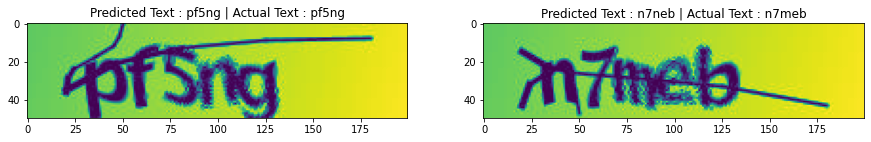

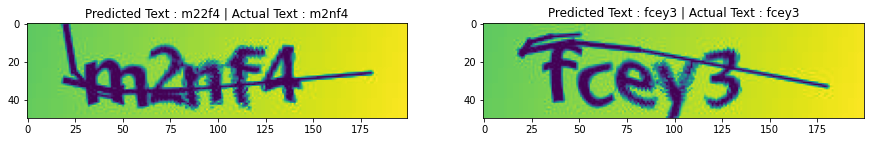

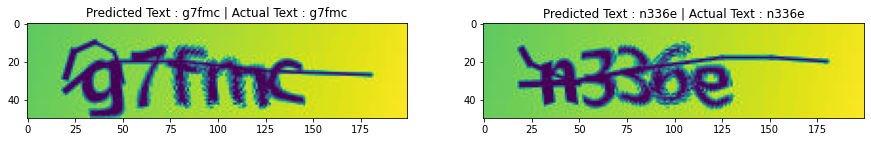

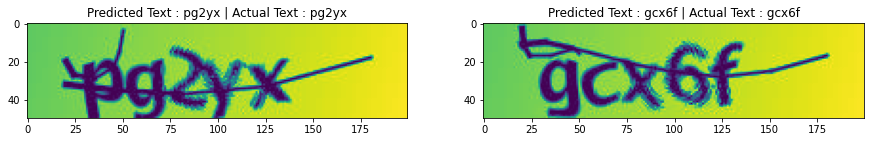

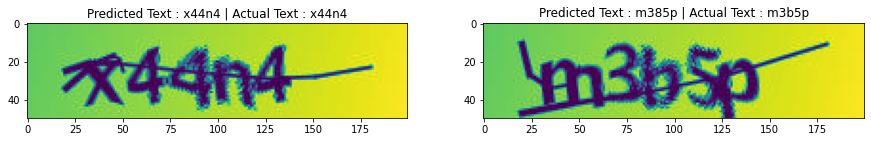

...

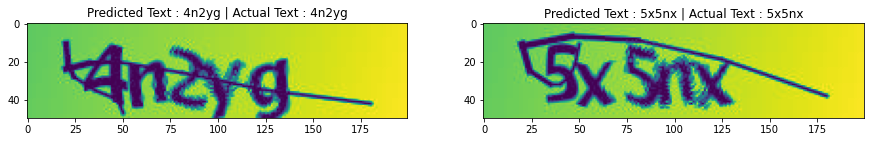

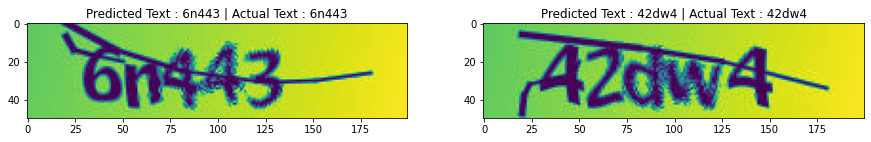

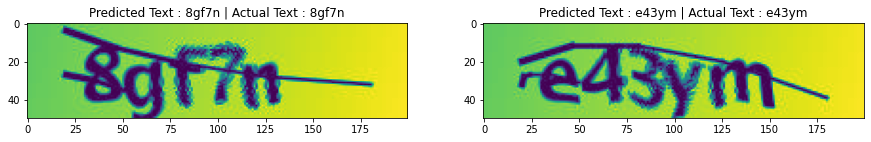

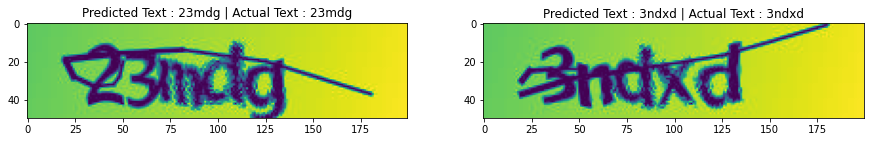

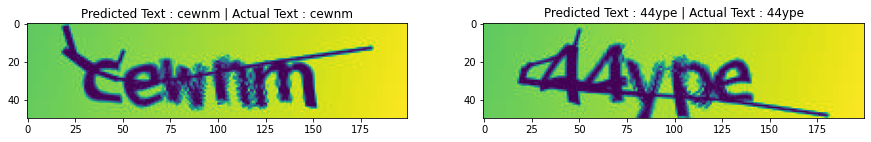

In [ ]:
def plot_samplee(predicted_CaptchaText: list = predictedCaptchaText, xy:tuple=(X_test, y_test),test_CaptchaText: list = testCaptchaText, num_TestingSamples:int=numTestingSamples) -> None:
    """
      plot number of samples in some pistures

      Arguments:
          predicted_CaptchaText --  list of predicted CAPTCHAs
          xy -- Tuple of x and y test
          test_CaptchaText -- list of tested CAPTCHAs
          num_TestingSamples -- Number of testing samples
        
    """

    X_test, y_test = xy
    
    num = int(num_TestingSamples / 2)
    
    for i in range(0, int(num)):
        fig, axs = plt.subplots(1, 2, figsize=(15, 15))
        axs[0].imshow(np.reshape(X_test[2 * i], (50, 200)))
        axs[0].set_title(f'Predicted Text : {predicted_CaptchaText[2 * i]} | Actual Text : {test_CaptchaText[2 * i]}')
        axs[1].imshow(np.reshape(X_test[2 * i + 1], (50, 200)))
        axs[1].set_title(
            f'Predicted Text : {predicted_CaptchaText[2 * i + 1]} | Actual Text : {test_CaptchaText[2 * i + 1]}')
        plt.savefig(fname="./pred_images/predictions"+ str(i) + ".png")
    plt.show()
plot_samplee(predicted_CaptchaText=predictedCaptchaText, test_CaptchaText=testCaptchaText)